In [1]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import sys

import tensorflow as tf
import keras
from keras import layers
from keras import ops
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

keras.utils.set_random_seed(123)

2025-10-25 16:12:30.717485: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
annotation_folder = "/dataset/"
if not os.path.exists(os.path.abspath(".") + annotation_folder):
    annotation_zip = keras.utils.get_file(
        "val.tar.gz",
        cache_subdir=os.path.abspath("."),
        origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",
        extract=True,
    )

2774625282/2774625282 ━━━━━━━━━━━━━━━━━━━━ 274s 0us/step


In [2]:
path = "val_extracted/val/indoors" #set the path correctly

filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".png")],
    "depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],
}
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42)
df.head(10)

,image,depth,mask
234,val_extracted/val/indoors/scene_00021/scan_001...,val_extracted/val/indoors/scene_00021/scan_001...,val_extracted/val/indoors/scene_00021/scan_001...
110,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...
248,val_extracted/val/indoors/scene_00021/scan_001...,val_extracted/val/indoors/scene_00021/scan_001...,val_extracted/val/indoors/scene_00021/scan_001...
9,val_extracted/val/indoors/scene_00019/scan_001...,val_extracted/val/indoors/scene_00019/scan_001...,val_extracted/val/indoors/scene_00019/scan_001...
93,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...
219,val_extracted/val/indoors/scene_00021/scan_001...,val_extracted/val/indoors/scene_00021/scan_001...,val_extracted/val/indoors/scene_00021/scan_001...
287,val_extracted/val/indoors/scene_00021/scan_001...,val_extracted/val/indoors/scene_00021/scan_001...,val_extracted/val/indoors/scene_00021/scan_001...
198,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...
203,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...
101,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...,val_extracted/val/indoors/scene_00020/scan_001...


In [3]:
HEIGHT = 256
WIDTH = 256
LR = 0.00001
EPOCHS = 30
BATCH_SIZE = 10  #SET THIS TO YOUR GPU LIMIT

In [4]:
class DataGenerator(keras.utils.PyDataset):
    def __init__(self, data, batch_size=6, dim=(768, 1024), n_channels=3, shuffle=True):
        super().__init__()
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):
        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self, image_path, depth_map, mask):
        """Load input and target image."""

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

    def data_generation(self, batch):
        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )
        x, y = x.astype("float32"), y.astype("float32")
        return x, y

I0000 00:00:1761401558.675914   18801 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 8733 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2080 Ti, pci bus id: 0000:08:00.0, compute capability: 7.5


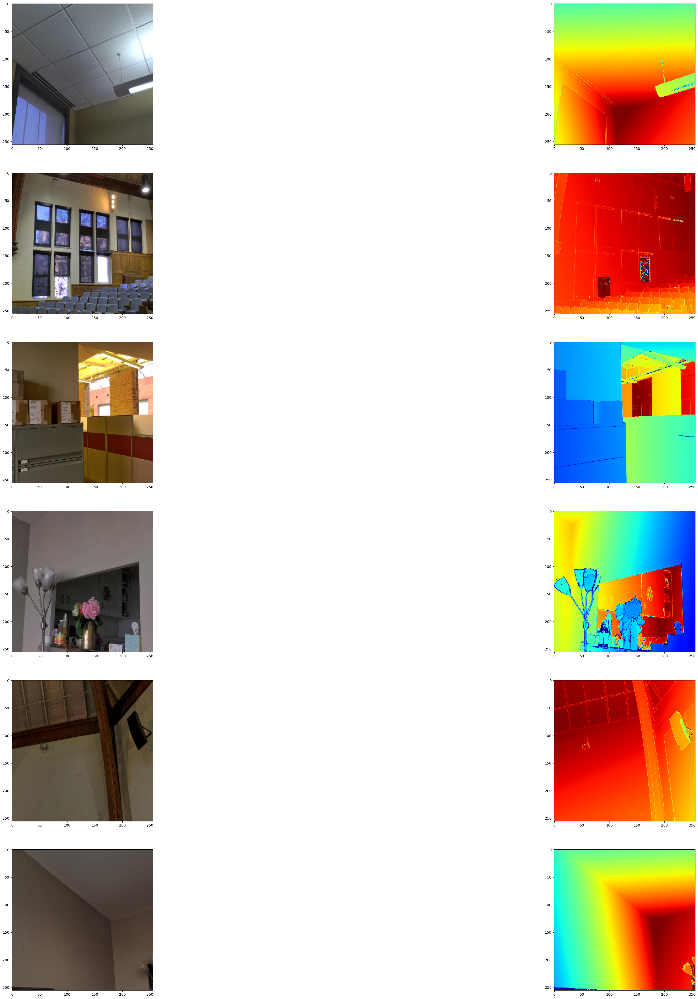

In [5]:
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)

    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(
    iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH)))
)
visualize_depth_map(visualize_samples)

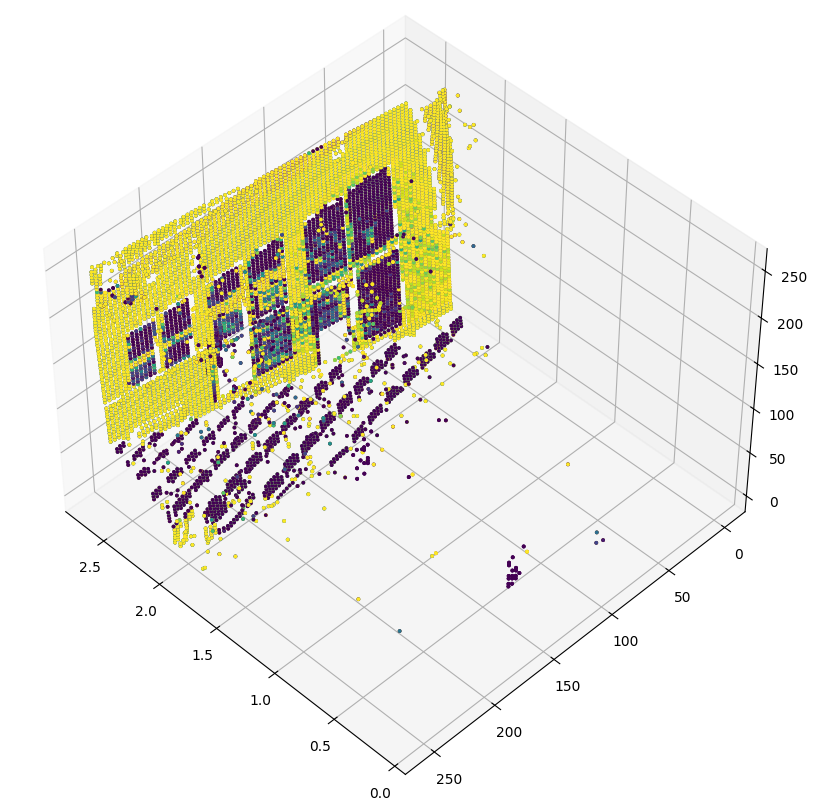

In [6]:
depth_vis = np.flipud(visualize_samples[1][1].squeeze())  # target
img_vis = np.flipud(visualize_samples[0][1].squeeze())  # input

fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection="3d")

STEP = 3
for x in range(0, img_vis.shape[0], STEP):
    for y in range(0, img_vis.shape[1], STEP):
        ax.scatter(
            [depth_vis[x, y]] * 3,
            [y] * 3,
            [x] * 3,
            c=tuple(img_vis[x, y, :3] / 255),
            s=3,
        )
    ax.view_init(45, 135)

In [7]:
class DownscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(negative_slope=0.2)
        self.reluB = layers.LeakyReLU(negative_slope=0.2)
        self.bn2a = layers.BatchNormalization()
        self.bn2b = layers.BatchNormalization()

        self.pool = layers.MaxPool2D((2, 2), (2, 2))

    def call(self, input_tensor):
        d = self.convA(input_tensor)
        x = self.bn2a(d)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        x += d
        p = self.pool(x)
        return x, p


class UpscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.us = layers.UpSampling2D((2, 2))
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(negative_slope=0.2)
        self.reluB = layers.LeakyReLU(negative_slope=0.2)
        self.bn2a = layers.BatchNormalization()
        self.bn2b = layers.BatchNormalization()
        self.conc = layers.Concatenate()

    def call(self, x, skip):
        x = self.us(x)
        concat = self.conc([x, skip])
        x = self.convA(concat)
        x = self.bn2a(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        return x


class BottleNeckBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(negative_slope=0.2)
        self.reluB = layers.LeakyReLU(negative_slope=0.2)

    def call(self, x):
        x = self.convA(x)
        x = self.reluA(x)
        x = self.convB(x)
        x = self.reluB(x)
        return x

In [8]:
def image_gradients(image):
    if len(ops.shape(image)) != 4:
        raise ValueError(
            "image_gradients expects a 4D tensor "
            "[batch_size, h, w, d], not {}.".format(ops.shape(image))
        )

    image_shape = ops.shape(image)
    batch_size, height, width, depth = ops.unstack(image_shape)

    dy = image[:, 1:, :, :] - image[:, :-1, :, :]
    dx = image[:, :, 1:, :] - image[:, :, :-1, :]

    # Return tensors with same size as original image by concatenating
    # zeros. Place the gradient [I(x+1,y) - I(x,y)] on the base pixel (x, y).
    shape = ops.stack([batch_size, 1, width, depth])
    dy = ops.concatenate([dy, ops.zeros(shape, dtype=image.dtype)], axis=1)
    dy = ops.reshape(dy, image_shape)

    shape = ops.stack([batch_size, height, 1, depth])
    dx = ops.concatenate([dx, ops.zeros(shape, dtype=image.dtype)], axis=2)
    dx = ops.reshape(dx, image_shape)

    return dy, dx


class DepthEstimationModel(keras.Model):
    def __init__(self):
        super().__init__()
        self.ssim_loss_weight = 0.85
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = keras.metrics.Mean(name="loss")
        f = [16, 32, 64, 128, 256]
        self.downscale_blocks = [
            DownscaleBlock(f[0]),
            DownscaleBlock(f[1]),
            DownscaleBlock(f[2]),
            DownscaleBlock(f[3]),
        ]
        self.bottle_neck_block = BottleNeckBlock(f[4])
        self.upscale_blocks = [
            UpscaleBlock(f[3]),
            UpscaleBlock(f[2]),
            UpscaleBlock(f[1]),
            UpscaleBlock(f[0]),
        ]
        self.conv_layer = layers.Conv2D(1, (1, 1), padding="same", activation="tanh")

    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = image_gradients(target)
        dy_pred, dx_pred = image_gradients(pred)
        weights_x = ops.cast(ops.exp(ops.mean(ops.abs(dx_true))), "float32")
        weights_y = ops.cast(ops.exp(ops.mean(ops.abs(dy_true))), "float32")

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = ops.mean(abs(smoothness_x)) + ops.mean(
            abs(smoothness_y)
        )

        # Structural similarity (SSIM) index
        ssim_loss = ops.mean(
            1
            - tf.image.ssim(
                target, pred, max_val=WIDTH, filter_size=7, k1=0.01**2, k2=0.03**2
            )
        )
        # Point-wise depth
        l1_loss = ops.mean(ops.abs(target - pred))

        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def call(self, x):
        c1, p1 = self.downscale_blocks[0](x)
        c2, p2 = self.downscale_blocks[1](p1)
        c3, p3 = self.downscale_blocks[2](p2)
        c4, p4 = self.downscale_blocks[3](p3)

        bn = self.bottle_neck_block(p4)

        u1 = self.upscale_blocks[0](bn, c4)
        u2 = self.upscale_blocks[1](u1, c3)
        u3 = self.upscale_blocks[2](u2, c2)
        u4 = self.upscale_blocks[3](u3, c1)

        return self.conv_layer(u4)

In [9]:
optimizer = keras.optimizers.SGD(
    learning_rate=LR,
    nesterov=False,
)
model = DepthEstimationModel()
# Compile the model
model.compile(optimizer)

train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
model.fit(
    train_loader,
    epochs=EPOCHS,
    validation_data=validation_loader,
)

Epoch 1/30


2025-10-25 16:13:23.176668: I external/local_xla/xla/service/service.cc:163] XLA service 0x791bc8004320 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-10-25 16:13:23.176679: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 2080 Ti, Compute Capability 7.5
2025-10-25 16:13:23.296081: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-10-25 16:13:23.424264: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert/Assert
2025-10-25 16:13:23.424571: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_1/Assert
2025-10-25 16:13:23.425078: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_2/Assert
2025-10-25 16:13:23.425735: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ig

 2/26 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 1.3772 

I0000 00:00:1761401616.252886   18906 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step - loss: 1.3755

2025-10-25 16:13:45.240937: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert/Assert
2025-10-25 16:13:45.241275: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_1/Assert
2025-10-25 16:13:45.241854: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_2/Assert
2025-10-25 16:13:45.242209: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_3/Assert
2025-10-25 16:13:47.177139: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert/Assert
2025-10-25 16:13:47.177258: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_1/Assert
2025-10-25 16:13:47.177389: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_2/Assert
2025-10-25 16:13:47.177489: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator S

26/26 ━━━━━━━━━━━━━━━━━━━━ 32s 627ms/step - loss: 1.3713 - val_loss: 1.0478
Epoch 2/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 380ms/step - loss: 1.3637 - val_loss: 0.9819
Epoch 3/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 378ms/step - loss: 1.3588 - val_loss: 1.0246
Epoch 4/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 387ms/step - loss: nan - val_loss: nan
Epoch 5/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 380ms/step - loss: nan - val_loss: nan
Epoch 6/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 383ms/step - loss: nan - val_loss: nan
Epoch 7/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 385ms/step - loss: nan - val_loss: nan
Epoch 8/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 384ms/step - loss: nan - val_loss: nan
Epoch 9/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 376ms/step - loss: nan - val_loss: nan
Epoch 10/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 375ms/step - loss: nan - val_loss: nan
Epoch 11/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 376ms/step - loss: nan - val_loss: nan
Epoch 12/30
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 377ms/step - loss: nan - val_loss: nan
Epoch 13/30
26/26 

2025-10-25 16:18:36.877049: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[6,16,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[6,3,256,256]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-25 16:18:36.953919: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[6,16,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[6,16,256,256]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="_

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


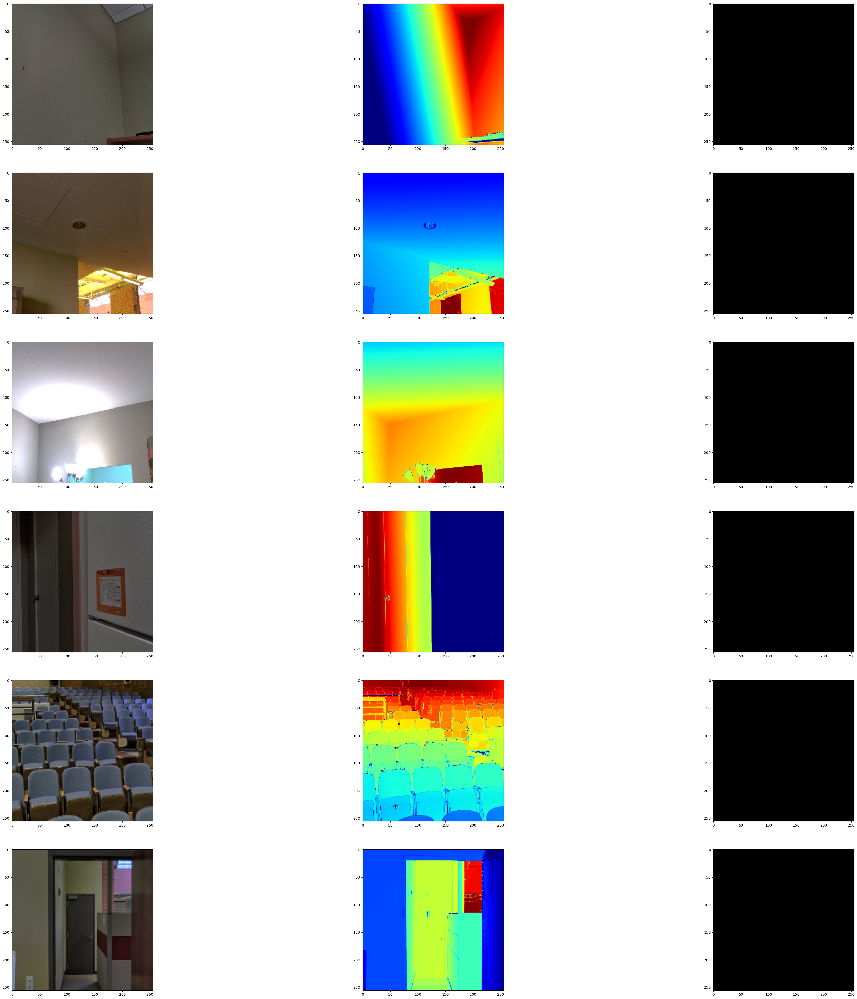

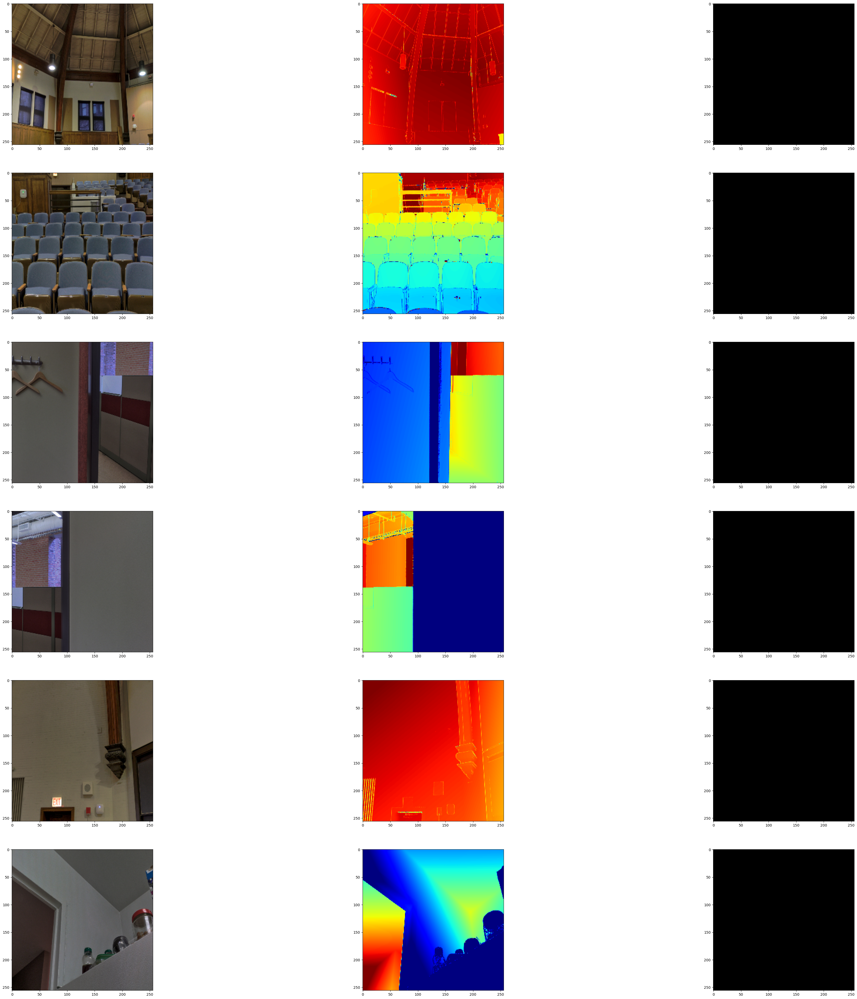

In [10]:
test_loader = next(
    iter(
        DataGenerator(
            data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

test_loader = next(
    iter(
        DataGenerator(
            data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)